<a href="https://colab.research.google.com/github/Slautin/2025_Attention/blob/main/3_Attention_VAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2025 Attention and SHAP: VAE explainability

**Notebook 3/3**

06/03/2025

- Author: **Boris Slautin**
- Idea: **Sergei V Kalinin** and **Utkarsh Pratiush**
- Transformer model: **Utkarsh Pratiush**
- Sample: **Hiroshi Funakubo**
- Dataset: **Yongtao Liu**
- Pyroved lib: **Maxim Ziatdinov**



In [1]:
!pip install --upgrade git+https://github.com/ziatdinovmax/atomai.git
!pip install --upgrade git+https://github.com/ziatdinovmax/pyroved.git

  Cloning https://github.com/ziatdinovmax/atomai.git to /tmp/pip-req-build-3xrp_snz
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/atomai.git /tmp/pip-req-build-3xrp_snz
  Resolved https://github.com/ziatdinovmax/atomai.git to commit bc1297eef086fd15e08887f6730ee92f98f073c9
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.7/277.7 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

import h5py
import re
from glob import glob

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
np.random.seed(42)
torch.manual_seed(42)

import atomai as aoi
from atomai import utils
import pyroved as pv

from sklearn.model_selection import train_test_split

In [3]:
#@title functions for saving data

def convert_to_supported_dtype(arr):
    # Check if array has an object dtype
    if arr.dtype == np.dtype('O'):
        # Attempt conversion to a compatible type (if possible)
        try:
            return arr.astype(np.float64)  # Change to a compatible type (e.g., float)
        except ValueError:
            raise ValueError(f"Cannot convert array '{arr}' to a supported dtype.")
    return arr

def save_dict_to_hdf5(file_path, data_dict):
    def save_data(group, data):
        for key, value in data.items():
            if isinstance(value, dict):
                subgroup = group.create_group(key)
                save_data(subgroup, value)
            elif isinstance(value, np.ndarray):
                # Check and convert object dtype arrays if needed
                value = convert_to_supported_dtype(value)
                group.create_dataset(key, data=value)
            elif isinstance(value, int):
              value = np.array([value, ])
              value = convert_to_supported_dtype(value)
              group.create_dataset(key, data=value)
            else:
                group.create_dataset(key, data=value)
    with h5py.File(file_path, 'w') as f:
        save_data(f, data_dict)

def load_hdf5_to_dict(file_path):
    def load_data(group):
        data = {}
        for key, item in group.items():
            if isinstance(item, h5py.Group):
                data[key] = load_data(item)
            else:
                data[key] = np.array(item)
        return data

    with h5py.File(file_path, 'r') as f:
        data_dict = load_data(f)

    return data_dict

In [4]:
#@title arbitrary functions

normalize = lambda x: (x - x.min()) / (x.max() - x.min())

def get_patches(patch_image, ws=8):
  coordinates = utils.get_coord_grid(patch_image, 1)   #grid
  pix = int(len(patch_image)+1-ws)
  features_all, coords, _ = utils.extract_subimages(patch_image, coordinates, ws)
  features_all = features_all[:,:,:,0]
  return coordinates, (features_all, coords)

def train_vae(features_all,
              latent_dim=10,
              invariances=['r'],
              batch_size = 128,
              epoches = 500):
  in_dim = features_all.shape[1:]
  vae_data = torch.tensor(features_all).float()
  vae_loader = pv.utils.init_dataloader(vae_data, batch_size=batch_size)

  seed = 42
  torch.manual_seed(seed);

  rvae_all = pv.models.iVAE(in_dim,
                            latent_dim=latent_dim,
                            invariances=invariances,
                            sampler_d='gaussian',
                            decoder_sig=0.01,
                            seed=42)

  trainer = pv.trainers.SVItrainer(rvae_all)
  for e in range(epoches):
    trainer.step(vae_loader, scale_factor=1)
    trainer.print_statistics()

  z_mean_all, z_sd_all = rvae_all.encode(vae_data)

  return z_mean_all, z_sd_all

from scipy.signal import correlate2d

def radial_average(acf):
    y, x = np.indices(acf.shape)
    center = np.array(acf.shape) // 2
    r = np.sqrt((x - center[1])**2 + (y - center[0])**2)
    r = r.astype(np.int32)

    tbin = np.bincount(r.ravel(), acf.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr
    return radialprofile

def correlation_length(ar, threshold=np.exp(-1)):
  l = int(ar.shape[0]**.5)
  val_2d = ar.reshape(l,l) - ar.mean()

  autocorr = correlate2d(val_2d, val_2d, mode='full', boundary='symm')
  autocorr = autocorr / np.max(autocorr)  # Normalize

  radial_profile = radial_average(autocorr)
  r = np.argwhere(radial_profile < threshold)[0]

  if len(r) == 0:
    return np.nan
  else:
    return r[0]  # Already below at first point

def correct_phase(phase, visualize=False):
  min_ = np.min(phase)
  max_ = np.max(phase)

  pha_correct = np.where(phase > 1.57, phase + (min_-max_), phase)
  pha_correct = pha_correct +np.pi - 0.75

  if visualize:
    plt.figure(figsize=(4,3))
    plt.hist(phase.ravel(), bins = 500, color='blue', label='before')
    plt.hist(pha_correct.reshape(-1),bins = 500, color='green', label='after');
    plt.axvline(np.pi, color ='red')
    plt.axvline(0, color ='red')
    plt.legend()

  return pha_correct

def get_area(loop_x, loop_y):
  x0, x1 = loop_x[: len(loop_x)//2], loop_x[len(loop_x)//2:]
  y0, y1 = loop_y[: len(loop_y)//2], loop_y[len(loop_y)//2:]
  p1 = np.abs(shoelace_formula(x0, y0))
  p2 = np.abs(shoelace_formula(x1, y1))
  return p1 + p2

def shoelace_formula(x, y):
    return 0.5 * np.abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1)))

def rotate_phase(signal, delta_phi, wrap='pi'):
    """
    Rotate a phase signal by a given phase shift.

    Parameters:
    - signal: array-like or scalar, original phase signal (in radians)
    - delta_phi: scalar, phase shift to apply (in radians)
    - wrap: 'pi' or '2pi', determines the wrapping range
            'pi'  -> wraps to [-π, π)
            '2pi' -> wraps to [0, 2π)

    Returns:
    - rotated_signal: same shape as input, phase-shifted and wrapped
    """
    rotated = np.asarray(signal) + delta_phi

    if wrap == 'pi':
        rotated = (rotated + np.pi) % (2 * np.pi) - np.pi
    elif wrap == '2pi':
        rotated = rotated % (2 * np.pi)
    else:
        raise ValueError("wrap must be either 'pi' or '2pi'")

    return rotated

In [124]:
#@title Attention model
class SelfAttention(nn.Module):
    def __init__(self, dim, heads=4):
        super().__init__()
        self.dim = dim
        self.heads = heads
        self.head_dim = dim // heads
        self.to_qkv = nn.Linear(dim, dim * 3)
        self.to_out = nn.Linear(dim, dim)
        self.scale = self.head_dim ** -0.5

    def forward(self, x):
        b, n, _ = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=-1)
        q, k, v = map(lambda t: t.view(b, n, self.heads, self.head_dim).transpose(1, 2), qkv)
        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale
        attn = dots.softmax(dim=-1)
        out = torch.matmul(attn, v)
        out = out.transpose(1, 2).reshape(b, n, -1)
        out = self.to_out(out)
        self.attention_weights = attn# Save attention weights for visualization
        return out

class TransformerRegressor(nn.Module):
    def __init__(self, input_dim, output_dim=1, hidden_dim=64, heads=8):
        super().__init__()
        self.embedding = nn.Linear(1, hidden_dim)
        self.pos_encoding = nn.Parameter(torch.randn(1, input_dim, hidden_dim))

        self.attention = SelfAttention(hidden_dim, heads=heads)
        self.norm1 = nn.LayerNorm(hidden_dim)

        self.ff = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim * 4),
            nn.GELU(),
            nn.Linear(hidden_dim * 4, hidden_dim)
        )
        self.norm2 = nn.LayerNorm(hidden_dim)
        self.to_out = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        b, n = x.shape
        x = x.unsqueeze(-1)
        x = self.embedding(x)
        x = x + self.pos_encoding
        attn_out = self.attention(x)
        x = self.norm1(x + attn_out)
        ff_out = self.ff(x)
        x = self.norm2(x + ff_out)
        x = x.mean(dim=1)########## pooling
        out = self.to_out(x)
        return out

def train_attention_regressor(X,
                              y,
                              test_size=0.2,
                              random_state=42,
                              batch_size = 128,
                              hidden_dim = 64,
                              heads = 4,
                              n_epochs = 200):

  X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
  n_points = X_train.shape[1]
  print(X_train.shape)

  model = TransformerRegressor(input_dim=n_points,
                               output_dim=1,
                               hidden_dim=hidden_dim,
                               heads = heads)
  model.cuda()
  criterion = nn.MSELoss()
  optimizer = optim.Adam(model.parameters(), lr=0.001)

  train_losses = []
  val_losses = []

  X_train_tensor = torch.FloatTensor(X_train).to('cuda')
  y_train_tensor = torch.FloatTensor(y_train).unsqueeze(1).to('cuda')
  X_val_tensor = torch.FloatTensor(X_val).to('cuda')
  y_val_tensor = torch.FloatTensor(y_val).unsqueeze(1).to('cuda')
  train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
  val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
  train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
  val_loader = DataLoader(val_dataset, batch_size=batch_size)

  for epoch in range(n_epochs):
    print(f"Starting EPCOH = {epoch}")
    model.train()
    epoch_loss = 0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()

        y_pred = model(X_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    train_losses.append(epoch_loss / len(train_loader))

    # Validation
    model.eval();
    val_loss = 0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            y_pred = model(X_batch)
            val_loss += criterion(y_pred, y_batch).item()

    val_losses.append(val_loss / len(val_loader))

    print(f'Epoch {epoch+1}/{n_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')


  return model
  #predictions
  zz = z_mean_all[:,:]
  print(f"Prediction\n")
  predictions = np.array([])
  attent_weights = []
  for i in range(len(zz)):
    spectrum = zz[i]

    with torch.no_grad():
      model.eval();
      pred = model(torch.FloatTensor(spectrum).unsqueeze(0))
      attention_weights = visualize_attention(model, spectrum, epoch)

      attent_weights.append(attention_weights)
      predictions = np.append(predictions, pred)

  attent_weights = np.array(attent_weights)

  return model, predictions, attent_weights


def visualize_attention(model, spectrum, epoch, verbose=False):
    spectrum_tensor = torch.FloatTensor(spectrum).unsqueeze(0)

    with torch.no_grad():
        model.eval()
        _ = model(spectrum_tensor)
        attention_weights = model.attention.attention_weights.detach().cpu().numpy()

    avg_attention = attention_weights[0].mean(axis=0)
    attention_sum = avg_attention.sum(axis=0)
    attention_sum = attention_sum / attention_sum.max()  # Normalize
    if verbose:
      fig, axs = plt.subplots(3, 1, figsize=(14, 12))

      # Plot 1: Input spectrum
      axs[0].plot(spectrum,'o-',  color='blue')
      axs[0].set_title('Input Spectrum')
      axs[0].set_xlabel('x')
      axs[0].set_ylabel('Intensity')

      # Plot 2: Heatmap of attention
      sns.heatmap(avg_attention, cmap='viridis', ax=axs[1])
      axs[1].set_title(f'Attention Weights for EPOCH = {epoch}')
      axs[1].set_xlabel('Position')
      axs[1].set_ylabel('Query Position')

      # Plot 3: Overlay attention sum with spectrum
      axs[2].plot(spectrum, 'o-', label='Spectrum', color='blue')
      axs[2].plot(attention_sum, 'o-', label='Attention Weight', color='red', alpha=0.7)
      axs[2].set_title(f'Spectrum with Attention Weights for EPOCH = {epoch}')
      axs[2].set_xlabel('x')
      axs[2].set_ylabel('Intensity / Attention')
      axs[2].legend()

      plt.tight_layout()
      plt.show()

    return attention_sum

def save_model_dict(res_dict, path='models_with_lists.pth'):
  m_dict = res_dict.copy()
  for k in m_dict:
    models = m_dict[k]['model']
    m_dict[k]['model'] = [model.state_dict() for model in models]
  torch.save(m_dict, path)

def load_attention_regressor(model_dict,
                             hidden_dim = 64,):
  res_dict = model_dict.copy()
  for k in model_dict:
    n_points = model_dict[k]['att_w'][0].shape[1]#int(k)**2
    models = []
    for state in model_dict[k]['model']:
      model = TransformerRegressor(input_dim=n_points,
                                   output_dim=1,
                                   hidden_dim=hidden_dim)
      model.load_state_dict(state)
      models.append(model)
    res_dict[k]['model'] = models
  return res_dict

# 1. Preprocessing

### 1.1 Load data

In [6]:
!gdown https://drive.google.com/file/d/1vJX_SwkxUF9RVYB9DhliKAljqI9lwGg7/view?usp=sharing --fuzzy

Downloading...
From (original): https://drive.google.com/uc?id=1vJX_SwkxUF9RVYB9DhliKAljqI9lwGg7
From (redirected): https://drive.google.com/uc?id=1vJX_SwkxUF9RVYB9DhliKAljqI9lwGg7&confirm=t&uuid=9140195f-7fbd-4be9-9b60-408d80053208
To: /content/PTO_BEPS_3um.npz
100% 62.1M/62.1M [00:01<00:00, 43.7MB/s]


In [7]:
BEPS = np.load(r'PTO_BEPS_3um.npz', 'r+')

# DKL inputs
amp   = BEPS['Image_Amplitude'].astype(np.float64)
pha   = BEPS["Image_Phase"].astype(np.float64)
freq  = BEPS["Image_Frequency"].astype(np.float64)
q     = BEPS["Image_Q_Factor"].astype(np.float64)
pola  = amp * np.cos(pha)
# DKL targets
A_on  = BEPS['Image_On_Field_Loop_Area']
A_off = BEPS['Image_Off_Field_Loop_Area']
Cf    = (BEPS['Image_Positive_Coercive_Field'] - BEPS['Image_Negative_Coercive_Field'])/2#BEPS['Image_Positive_Coercive_Field']#BEPS['Image_Average_Coercive_Field']
bias = BEPS['Image_Average_Coercive_Field']
width = BEPS['Image_Loop_Width']
DC    = BEPS['Spectra_DC_Voltage']
spec  = BEPS['Spectra_Off_Field_Loop']

patch_image = normalize(pola)

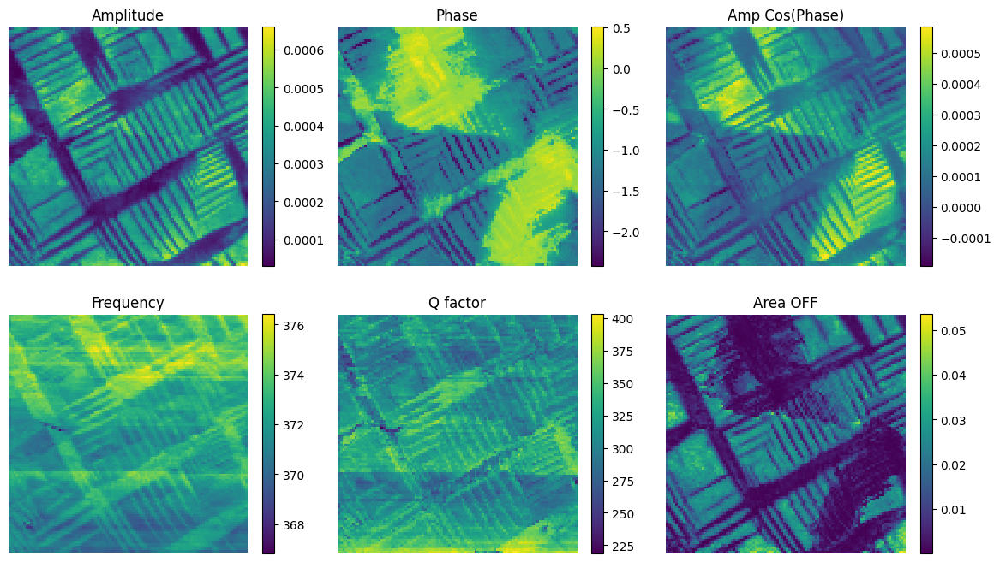

In [8]:
size_nm = 3000 #scan size
scale = amp.shape[0] / size_nm

fig, axs = plt.subplots(2, 3, figsize=(12, 7))
fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.1)
# Make 4 subplots:
cm = 'viridis'
shrink = 1

im1 = axs[0, 0].imshow(amp, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im1, ax=axs[0, 0], shrink = shrink)
axs[0, 0].set_title("Amplitude")
axs[0, 0].axis('off')

im2 = axs[0, 1].imshow(pha, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im2, ax=axs[0, 1], shrink = shrink)
axs[0, 1].set_title("Phase")
axs[0, 1].axis('off')

im3 = axs[0, 2].imshow(pola, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im3, ax=axs[0, 2], shrink = shrink)
axs[0, 2].set_title("Amp Cos(Phase)")
axs[0, 2].axis('off')

im4 = axs[1, 0].imshow(freq/1000, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im4, ax=axs[1, 0], shrink = shrink)
axs[1, 0].set_title("Frequency")
axs[1, 0].axis('off')

im5 = axs[1, 1].imshow(q, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im5, ax=axs[1, 1], shrink = shrink)
axs[1, 1].set_title("Q factor")
axs[1, 1].axis('off')

im6 = axs[1, 2].imshow(A_off, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im6, ax=axs[1, 2], shrink = shrink)
axs[1, 2].set_title("Area OFF")
axs[1, 2].axis('off')

plt.show()

## 1.2 Data preprocessing

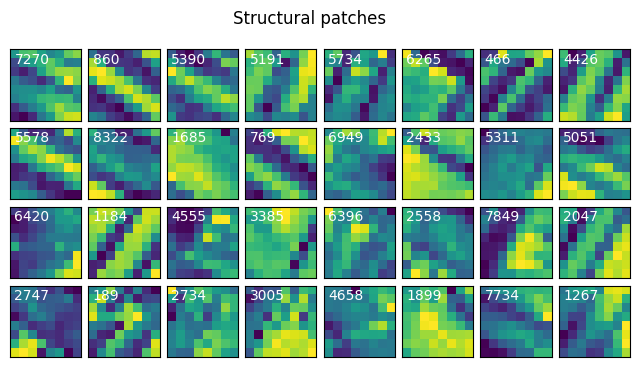

In [9]:
# Structural image patching (RCos[Phase])

#patch window size
ws = 8

# 2.1 normalize
patch_image = normalize(pola)

# 2.2. extract patches for each point on a grid
coordinates = utils.get_coord_grid(patch_image, 1)   #grid
pix = int(len(patch_image)+1-ws)
features_all, coords, _ = utils.extract_subimages(patch_image, coordinates, ws)
features_all = features_all[:,:,:,0]

#2.3 plot examples of patches
fig, axes = plt.subplots(4, 8, figsize=(8, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

fig.suptitle('Structural patches')

for ax in axes.flat:
    i = np.random.randint(len(features_all))
    ax.imshow(features_all[i], interpolation='nearest')
    ax.text(0, 1, str(i), color='white')

In [10]:
# Scalarizer (off-field loop area)
A_off = normalize(A_off)
Cf    = normalize(Cf)
freq1 = freq
freq = normalize(freq)
Ub = normalize(bias)

A_off_all = np.zeros(pix*pix)
Cf_all = np.zeros(pix*pix)
freq_all = np.zeros(pix*pix)
Ub_all = np.zeros(pix*pix)

for i in range(pix*pix):
  A_off_all[i] = A_off[int(coords[i,0]), int(coords[i,1])]
  Cf_all[i] = Cf[int(coords[i,0]), int(coords[i,1])]
  freq_all[i] = freq[int(coords[i,0]), int(coords[i,1])]
  Ub_all[i] = Ub[int(coords[i,0]), int(coords[i,1])]

A_off_all   = A_off_all.reshape(-1)
Cf_all  = Cf_all.reshape(-1)
freq_all = freq_all.reshape(-1)
Ub_all = Ub_all.reshape(-1)

targets = [freq, A_off,Cf, Ub]

In [11]:
#training dataset
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)  #training input: image patches

y_targ = A_off_all.reshape(-1)     #training target
y_targ = normalize(y_targ)

y = y_targ.reshape(-1)
X.shape, y.shape

((8649, 64), (8649,))

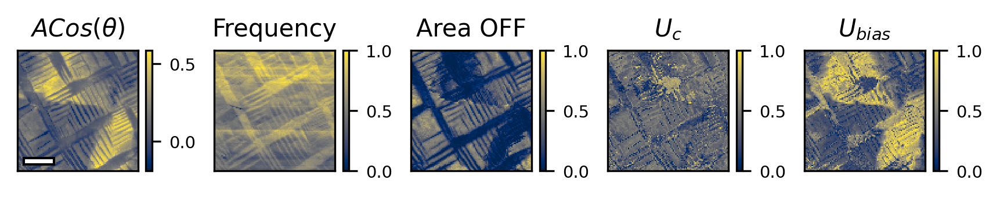

In [12]:
size_nm = 3000 #scan size
scale = amp.shape[0] / size_nm

origin = 0.05*patch_image.shape[0], 0.05*patch_image.shape[1]
length = len(patch_image[0])/4
height = length/5

fig, axs = plt.subplots(1, 5, figsize=(7, .9), dpi=300)
fig.subplots_adjust(wspace=.25)
cm = 'cividis'

im1 = axs[0].imshow(pola*1e3, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im1, ax=axs[0])
cbar.ax.tick_params(labelsize=7)
axs[0].set_title(r"$ACos(\theta)$", fontsize=10)
#axs[0].axis('off')
axs[0].add_patch(patches.Rectangle(origin, length, height, color = 'white', ec='k', lw=1, fill = True))

im4 = axs[1].imshow(freq, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im4, ax=axs[1])
cbar.ax.tick_params(labelsize=7)
axs[1].set_title("Frequency", fontsize=10)
#axs[1].axis('off')

im6 = axs[2].imshow(A_off, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im6, ax=axs[2])
cbar.ax.tick_params(labelsize=7)
axs[2].set_title("Area OFF", fontsize=10)
#axs[2].axis('off')

im7 = axs[3].imshow(Cf, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im7, ax=axs[3])
cbar.ax.tick_params(labelsize=7)
axs[3].set_title(r"$U_c$", fontsize=10)
#axs[3].axis('off')

im8 = axs[4].imshow(Ub, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im8, ax=axs[4])
cbar.ax.tick_params(labelsize=7)
axs[4].set_title(r"$U_{bias}$", fontsize=10)

for ax in axs:
  ax.set_xticks([])
  ax.set_yticks([])

fig.savefig('base_image.jpg', dpi=300, bbox_inches='tight')

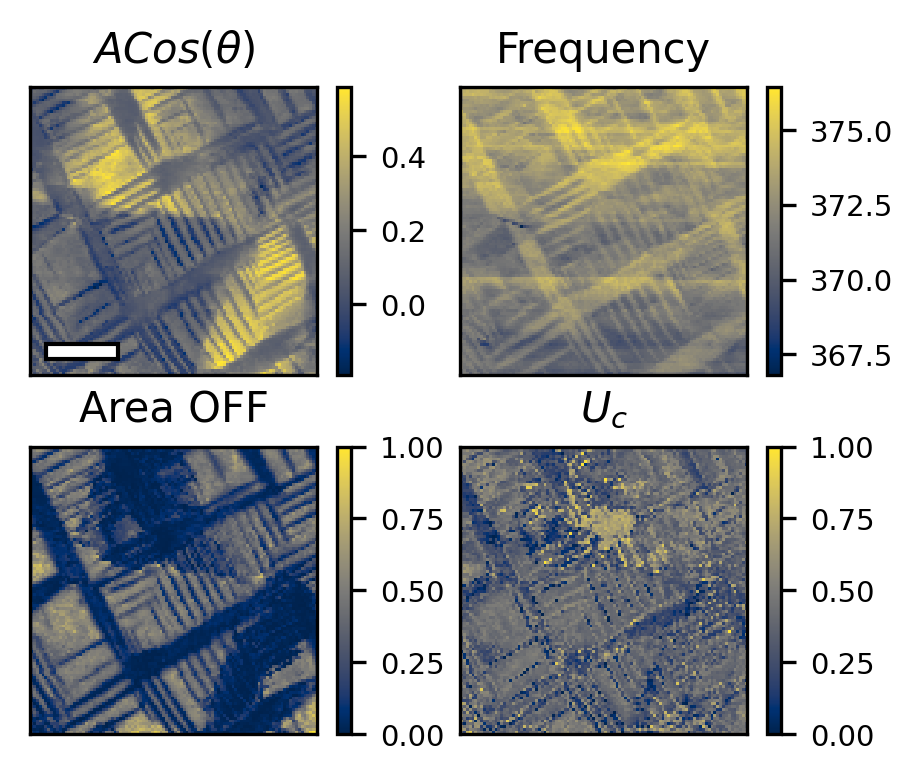

In [13]:
size_nm = 3000 #scan size
scale = amp.shape[0] / size_nm

origin = 0.05*patch_image.shape[0], 0.05*patch_image.shape[1]
length = len(patch_image[0])/4
height = length/5

fig, axs = plt.subplots(2, 2, figsize=(3.5, 2.8), dpi=300)
fig.subplots_adjust(wspace=.12, hspace=.25)
cm = 'cividis'

im1 = axs[0,0].imshow(pola*1e3, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im1, ax=axs[0,0])
cbar.ax.tick_params(labelsize=7)
axs[0,0].set_title(r"$ACos(\theta)$", fontsize=10)
#axs[0].axis('off')
axs[0,0].add_patch(patches.Rectangle(origin, length, height, color = 'white', ec='k', lw=1, fill = True))

im4 = axs[0,1].imshow(freq1/1e3, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im4, ax=axs[0,1])
cbar.ax.tick_params(labelsize=7)
axs[0,1].set_title("Frequency", fontsize=10)
#axs[1].axis('off')

im6 = axs[1,0].imshow(A_off, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im6, ax=axs[1,0])
cbar.ax.tick_params(labelsize=7)
axs[1,0].set_title("Area OFF", fontsize=10)
#axs[2].axis('off')

im7 = axs[1,1].imshow(Cf, interpolation='nearest', cmap=cm, origin='lower')
cbar = fig.colorbar(im7, ax=axs[1,1])
cbar.ax.tick_params(labelsize=7)
axs[1,1].set_title(r"$U_c$", fontsize=10)
#axs[3].axis('off')

for ax in axs.flatten():
  ax.set_xticks([])
  ax.set_yticks([])

fig.savefig('base_image.jpg', dpi=300, bbox_inches='tight')

#2. rVAE training

In [202]:
ws_list = [3, 5, 7, 9]

In [67]:
vae_models = {}

for ws in ws_list:
  coordinates, (features_all, coords) = get_patches(patch_image, ws=ws)
  print(f'------ Descriptor size {ws} ------')
  z_mean, z_std = train_vae(features_all,
                            latent_dim=2,
                            epoches=1000) #choose dimensionality of the latent space
  vae_models[str(ws)] = {'ws': ws,
                         'coords': coords,
                         'z_mean': z_mean,
                         'z_std': z_std}



------ Descriptor size 3 ------
Epoch: 1 Training loss: 582.1562
Epoch: 2 Training loss: 271.3169
Epoch: 3 Training loss: 261.9387
Epoch: 4 Training loss: 248.6331
Epoch: 5 Training loss: 179.7811
Epoch: 6 Training loss: 133.5027
Epoch: 7 Training loss: 108.8742
Epoch: 8 Training loss: 101.6151
Epoch: 9 Training loss: 88.7177
Epoch: 10 Training loss: 69.3312
Epoch: 11 Training loss: 66.1644
Epoch: 12 Training loss: 63.1408
Epoch: 13 Training loss: 59.4260
Epoch: 14 Training loss: 57.5663
Epoch: 15 Training loss: 54.7856
Epoch: 16 Training loss: 45.8331
Epoch: 17 Training loss: 38.1945
Epoch: 18 Training loss: 34.4376
Epoch: 19 Training loss: 30.7776
Epoch: 20 Training loss: 30.7537
Epoch: 21 Training loss: 28.3461
Epoch: 22 Training loss: 27.2786
Epoch: 23 Training loss: 26.4241
Epoch: 24 Training loss: 24.2197
Epoch: 25 Training loss: 24.0216
Epoch: 26 Training loss: 21.1095
Epoch: 27 Training loss: 20.5956
Epoch: 28 Training loss: 20.2889
Epoch: 29 Training loss: 17.9115
Epoch: 30 Tr

In [68]:
#save vae results as a dictionary
converted_dict = {
    k: np.array(v) if isinstance(v, int) else v
    for k, v in vae_models.items()}

save_dict_to_hdf5('regressor_vae_2d.h5',converted_dict) #save ONLY vae model

#3. Training of Attention Transformer

In [203]:
vae_models = load_hdf5_to_dict('regressor_vae_2d.h5')

z_means_ws = []
coords_ws = []
keys = sorted(vae_models.keys(), key=int)
for key in keys:
  z_means_ws.append(vae_models[key]['z_mean'])
  coords_ws.append(vae_models[key]['coords'])

ws_list = sorted([int(x) for x in list(vae_models.keys())], key=int)
ws_list

[3, 5, 7, 9]

In [204]:
res_att = {}
predictions = []
attention_weights = []
full_res = {}

for i,z_mean in enumerate(z_means_ws):
  _, (X, coords_ws) = get_patches(patch_image, ws=ws_list[i])
  ws = ws_list[i]
  print(f'----------- {ws} ------------')


  full_res[str(ws_list[i])] = {'X': X,
                       'coords': coords_ws,
                       'z_mean': z_mean,
                       'pred': [],
                       'att_w': [],
                       'model': [],
                       'y': [],}

  for j, target in enumerate(targets):
    y = target[*coords_ws.astype(int).T].flatten()
    full_res[str(ws_list[i])]['y'].append(y)

    m = train_attention_regressor(z_mean, y, n_epochs=200, heads = 4,)

    #m.cuda()
    m.cpu()
    pred = m(torch.Tensor(z_mean).to('cpu'))

    #attention
    att = m.attention.attention_weights.detach().cpu().numpy()
    sum_att = att.mean(1).sum(axis=1)
    sum_att = sum_att/sum_att.max(1)[np.newaxis,:].T

    full_res[str(ws)]['pred'].append(pred.detach().numpy())
    full_res[str(ws)]['att_w'].append(sum_att)
    full_res[str(ws)]['model'].append(m)

Streaming output truncated to the last 5000 lines.
Epoch 108/200, Train Loss: 0.0268, Val Loss: 0.0267
Starting EPCOH = 108
Epoch 109/200, Train Loss: 0.0267, Val Loss: 0.0272
Starting EPCOH = 109
Epoch 110/200, Train Loss: 0.0287, Val Loss: 0.0264
Starting EPCOH = 110
Epoch 111/200, Train Loss: 0.0280, Val Loss: 0.0274
Starting EPCOH = 111
Epoch 112/200, Train Loss: 0.0279, Val Loss: 0.0262
Starting EPCOH = 112
Epoch 113/200, Train Loss: 0.0276, Val Loss: 0.0265
Starting EPCOH = 113
Epoch 114/200, Train Loss: 0.0274, Val Loss: 0.0258
Starting EPCOH = 114
Epoch 115/200, Train Loss: 0.0272, Val Loss: 0.0265
Starting EPCOH = 115
Epoch 116/200, Train Loss: 0.0268, Val Loss: 0.0262
Starting EPCOH = 116
Epoch 117/200, Train Loss: 0.0270, Val Loss: 0.0273
Starting EPCOH = 117
Epoch 118/200, Train Loss: 0.0270, Val Loss: 0.0257
Starting EPCOH = 118
Epoch 119/200, Train Loss: 0.0267, Val Loss: 0.0263
Starting EPCOH = 119
Epoch 120/200, Train Loss: 0.0270, Val Loss: 0.0254
Starting EPCOH = 120


In [205]:
save_model_dict(full_res, path='vae_transformer_2d.pth')

# 4. SHAP

In [206]:
state_dicts = torch.load('vae_transformer_2d.pth', weights_only=False)
ws_list = sorted(list(state_dicts.keys()), key=int)
full_res = load_attention_regressor(state_dicts)
ws_list

['3', '5', '7', '9']

In [207]:
import shap

def wrapped_model(x_numpy):
    m.cuda()
    m.eval()
    with torch.no_grad():
        x_tensor = torch.tensor(x_numpy, dtype=torch.float32).to('cuda')  # shape: (batch, input_dim)
        output = m(x_tensor)  # shape: (batch, 1)
        return output.cpu().to('cpu').numpy().reshape(-1)

In [ ]:
full_res_shap = full_res.copy()


for i in range(len(ws_list)):
  print(f'---------{ws_list[i]}----------')
  full_res_shap[str(ws_list[i])]['shap'] = []

  for j in range(len(targets)):
    print(f'Target_{j}')

    z_mean = full_res[str(ws_list[i])]['z_mean']
    att = full_res[str(ws_list[i])]['att_w'][j]

    m = full_res[str(ws_list[i])]['model'][j]
    m.cpu()
    background = shap.kmeans(z_mean, 25)
    explainer = shap.KernelExplainer(wrapped_model, background)  # background set

    dataset = TensorDataset(torch.tensor(X))
    dataloader = DataLoader(dataset, batch_size=1000)
    shap_val = []
    #for batch in dataloader:
    sh_v = explainer.shap_values(torch.tensor(z_mean).numpy(), nsamples=50)

      #shap_val.append(sh_v)
    shap_val = np.array(sh_v)
    shap_val = shap_val.reshape(-1,shap_val.shape[-1])
    print(shap_val.shape)



    full_res_shap[str(ws_list[i])]['shap'].append(shap_val)


In [209]:
save_model_dict(full_res_shap, path='vae_transformer_shap_2d.pth')

# 5. Visualization: Self-correlation, attention and SHAP

## 5.1. 10D

You may either upload the model provided in the article or skip the next cell to use a model you have trained yourself.

In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/1ltuOxqohc-477-kuxDXq7toVMmLvWXaV/view?usp=sharing

In [178]:
state_dicts = torch.load(r'vae_transformer_shap_10d.pth', weights_only=False,  map_location=torch.device('cpu'))
full_res = load_attention_regressor(state_dicts)

scale = patch_image.shape[0] / 3000 #px/nm
ws_list = sorted(list(full_res.keys()), key=int)
ws_list

['3', '5', '7', '9']

In [179]:
#@title  self-correlation analysis

for ws in ws_list:
  arr = full_res[ws]['z_mean']
  full_length, number_of_lv = arr.shape

  cl_list = np.array([])
  for k in range(number_of_lv):
    arr_l = arr[:, k]

    cl = correlation_length(arr_l, threshold=np.exp(-1))
    cl_list = np.append(cl_list, cl)

  full_res[ws]['cor_length'] = cl_list

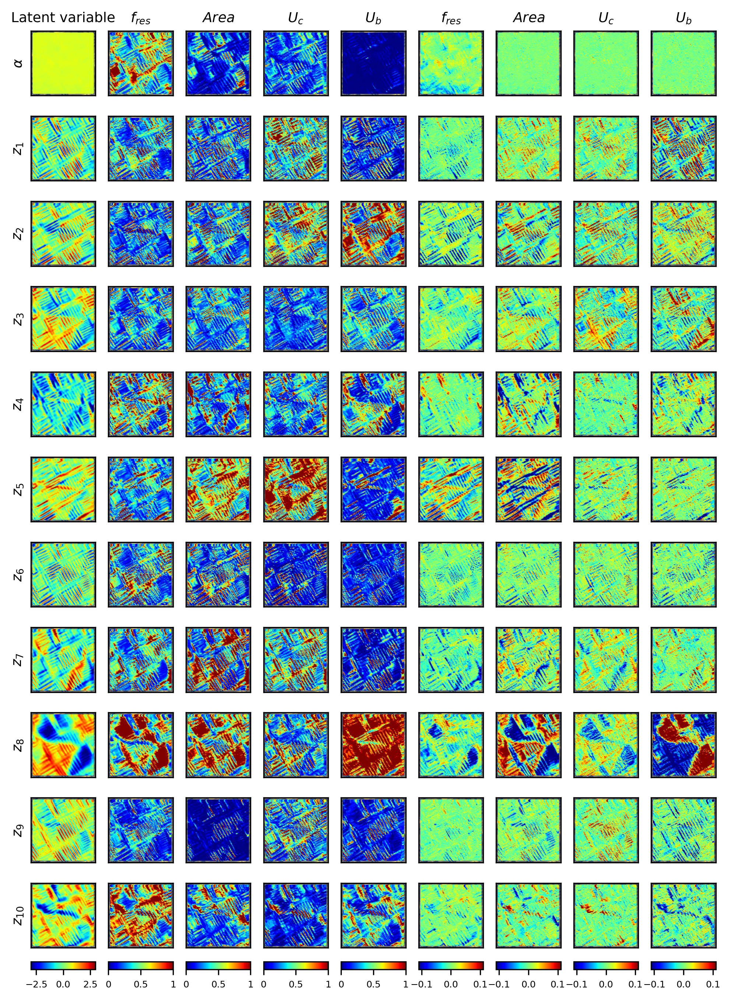

In [180]:
coords = full_res[str(ws_list[3])]['coords']#coords_ws[k].astype(int)
sh =  full_res[str(ws_list[3])]['shap']
att = full_res[str(ws_list[3])]['att_w']
zmean = full_res[str(ws_list[3])]['z_mean']

fig, ax = plt.subplots(12, 9, figsize=(8,11.1), dpi=300, gridspec_kw={'height_ratios': [1,1,1,1,1,1,1,1,1,1,1,.1]})
fig.subplots_adjust(hspace=.1)

for _ in ax[:-1,:].flatten():
  _.imshow(patch_image, interpolation='nearest', cmap='cividis', origin='lower')
  _.set_xticks([])
  _.set_yticks([])

for i, ax_ in enumerate(ax[:,0][:-1]):
  im = ax_.scatter(coords.T[1], coords.T[0], s=.3,
                   c=zmean[:,i], cmap='jet', vmin=-3, vmax=3)

  if i==0:
     ax_.set_ylabel(r'$\alpha$', fontsize=9)
  else:
    ax_.set_ylabel(f'$z_{i}$', fontsize=9)
ax[10,0].set_ylabel('$z_{10}$')

cbar = plt.colorbar(im, cax=ax[11,0], orientation='horizontal')
cbar.ax.tick_params(labelsize=6)

for k in range(4):
  for i, ax_ in enumerate(ax[:,k+1][:-1]):
    im = ax_.scatter(coords.T[1], coords.T[0], s=.3,
                     c=att[k][:,i], cmap='jet', vmin=0, vmax=1)
  cbar = plt.colorbar(im, cax=ax[11,k+1], orientation='horizontal')
  cbar.set_ticks([0,.5,1])
  cbar.set_ticklabels(['0','0.5','1'])
  cbar.ax.tick_params(labelsize=6)

  for i, ax_ in enumerate(ax[:,k+5][:-1]):
    im = ax_.scatter(coords.T[1], coords.T[0], s=.3,
                     c=sh[k][:,i], cmap='jet', vmin=-.11, vmax=.11)
  cbar = plt.colorbar(im, cax=ax[11,k+5], orientation='horizontal')
  cbar.ax.tick_params(labelsize=6)
  cbar.set_ticks([-0.1, 0, .1])
  #cbar.set_ticklabels(['-0.1','0','0.1'])
  cbar.ax.tick_params(labelsize=6)



ax[0,0].set_title('Latent variable', fontsize=9)
ax[0,1].set_title('$f_{res}$', fontsize=9)
ax[0,2].set_title('$Area$', fontsize=9)
ax[0,3].set_title('$U_c$', fontsize=9)
ax[0,4].set_title('$U_b$', fontsize=9)

ax[0,5].set_title('$f_{res}$', fontsize=9)
ax[0,6].set_title('$Area$', fontsize=9)
ax[0,7].set_title('$U_c$', fontsize=9)
ax[0,8].set_title('$U_b$', fontsize=9)

fig.savefig('fig4_r.jpg', dpi=300, bbox_inches='tight')


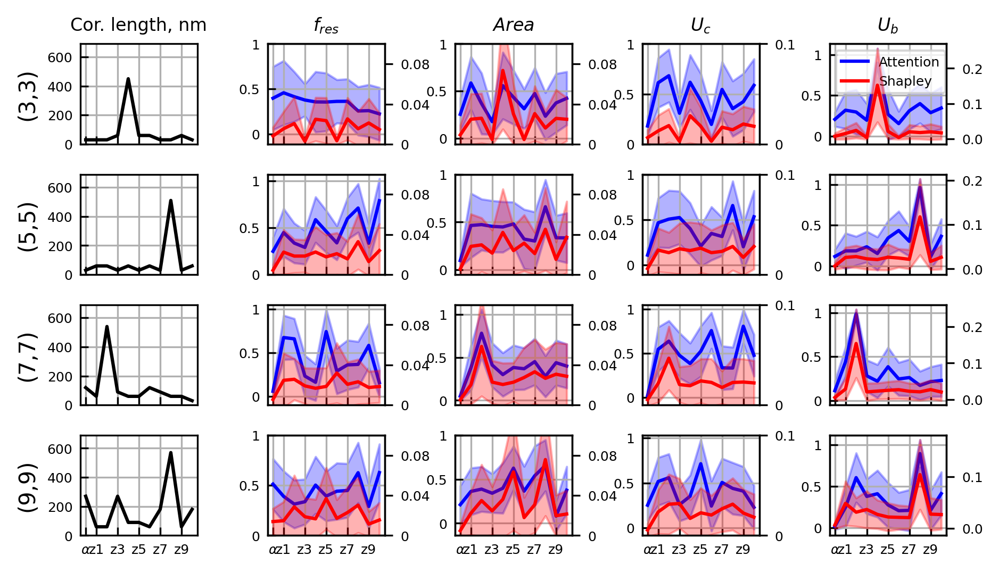

In [181]:
import string
alphabet_list = list(string.ascii_lowercase[:12])
x_ax = [r'$\alpha$',]+ [f'z{i}'for i in range(1,10,2)]
xticks = [0, ]+[i for i in range(1,10,2)]

fig, ax = plt.subplots(4, 5, figsize=(7,4), dpi=300, sharex=True)
fig.subplots_adjust(wspace=.6, hspace=.3)

for i,ax_ in enumerate(ax[:,0]):
  ws = ws_list[i]
  cor_ar = full_res[ws]['cor_length']/scale
  att_w_list = full_res[ws]['att_w']
  sh_v_l = full_res[ws]['shap']

  ax_.plot(cor_ar, '-', c='black')
  ax_.set_ylabel(f'({ws},{ws})')
  ax_.set_ylim(0,690)
  ax_.set_yticks([0,200,400,600], [0,200,400,600], fontsize=6)

  for k in range(1,5):
    att = att_w_list[k-1]
    mean_att = att.mean(0)
    std_att = att.std(0)
    sh = sh_v_l[k-1]
    mean_sh = abs(sh).mean(0)
    std_sh = abs(sh).std(0)

    ln1, = ax[i,k].plot(mean_att, c='b', label='Attention')
    ax[i,k].fill_between(np.arange(len(mean_att)),
                         mean_att - std_att,
                         mean_att + std_att,
                         alpha=.3, color='b')
    ax[i,k].set_yticks([0,0.5,1], [0,0.5,1], fontsize=6)

    axx = ax[i,k].twinx()

    ln2, = axx.plot(mean_sh, c='r', label='Shapley')
    axx.fill_between(np.arange(len(mean_sh)),
                         mean_sh - std_sh,
                         mean_sh + std_sh,
                         alpha=.3, color='r')
    axx.tick_params(labelsize=6)
    if k < 3:
      axx.set_ylim(0,.1)
      axx.set_yticks([0, .04, .08], [0, .04, .08], fontsize=6)
    if k==3:
      axx.set_ylim(0,.1)
      axx.set_yticks([0, .1, ], [0, .1, ], fontsize=6)
      if i==0:
        lines = [ln1, ln2]

        labels = [line.get_label() for line in lines]



for _ in ax.flatten():
  _.tick_params(direction='in', labelsize=6)
  _.grid()
  _.set_xticks(xticks, x_ax, fontsize=6)

ax[0,4].legend(lines, labels, loc='upper left', fontsize=6)

ax[0,0].set_title('Cor. length, nm', fontsize=8)
ax[0,1].set_title('$f_{res}$', fontsize=8)
ax[0,2].set_title('$Area$', fontsize=8)
ax[0,3].set_title('$U_c$', fontsize=8)
ax[0,4].set_title('$U_b$', fontsize=8)

fig.savefig('shap_attent_average.jpg', dpi=300, bbox_inches='tight')

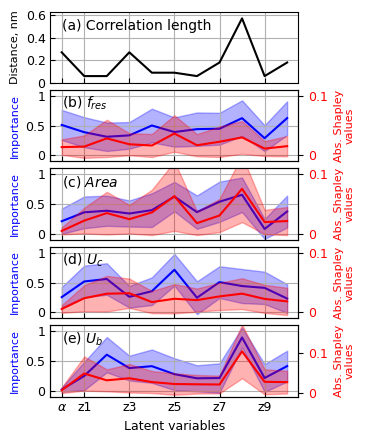

In [182]:
import string
alphabet_list = list(string.ascii_lowercase[:12])
x_ax = [r'$\alpha$',]+ [f'z{i}'for i in range(1,10,2)]
xticks = [0, ]+[i for i in range(1,10,2)]

res = full_res['9']
cor_ar = res['cor_length']/scale
sh_v_l = res['shap']
att_w_list = res['att_w']

fig, ax = plt.subplots(5,1, figsize=(3.2,5), sharex=True)#, dpi=300)
fig.subplots_adjust(wspace=.4, hspace=0.1)

ax[0].plot(cor_ar/1e3, '-', c='black')
ax[0].set_ylim(0,.63)
ax[0].set_yticks([0,.2,.4,.6], [0,.2,.4,.6], fontsize=9)
ax[0].set_ylabel('Distance, nm', fontsize=8)

for i in range(len(sh_v_l)):
  sh = sh_v_l[i]
  att = att_w_list[i]
  mean_sh = abs(sh).mean(0)
  mean_att = att.mean(0)

  im = ax[i+1].plot(mean_att, c='b', label='Attention Importance')
  im = ax[i+1].fill_between(np.arange(len(mean_att)), mean_att - att.std(0), mean_att + att.std(0),
                            alpha=.3, color='b')
  ax[i+1].set_ylabel('Importance', fontsize=8, color='b')
  ax[i+1].set_ylim(-.1, 1.1)
  ax[i+1].set_yticks([0,.5,1],[0,.5,1], fontsize=9)

  ax_ = ax[i+1].twinx()
  im=ax_.plot(mean_sh, c='r', label='Abs. Shapley values')
  ax_.fill_between(np.arange(len(mean_sh)), mean_sh - abs(sh).std(0), mean_sh + abs(sh).std(0),
                            alpha=.3, color='r')
  if i!=3:
    ax_.set_ylim(-.01,.11)
  else:
    ax_.set_ylim(-.01,.17)
  ax_.set_yticks([0,.1],[0,.1], c='r', fontsize=9)
  ax_.set_ylabel('Abs. Shapley\nvalues', fontsize=8, color='r')





for j,_ in enumerate(ax):
    _.grid()
    _.set_xticks(xticks, x_ax, fontsize=9)
    _.tick_params('both', direction='in')
ax[4].set_xlabel('Latent variables', fontsize=9)

ax[0].text(0,0.47,'(a) Correlation length', fontsize=10)
ax[1].text(0,0.8,'(b) $f_{res}$', fontsize=10)
ax[2].text(0,0.8,'(c) $Area$', fontsize=10)
ax[3].text(0,0.8,'(d) $U_c$', fontsize=10)
ax[4].text(0,0.8,'(e) $U_b$', fontsize=10)
# ax[0].set_title('Correlation length', fontsize=10)
# ax[1].set_title('Frequency', fontsize=10)
# ax[2].set_title('Area', fontsize=10)
# ax[3].set_title('Coercive voltage', fontsize=10)

fig.savefig('fig5.jpg', dpi=300, bbox_inches='tight')

### Number of pixels in desctriptor

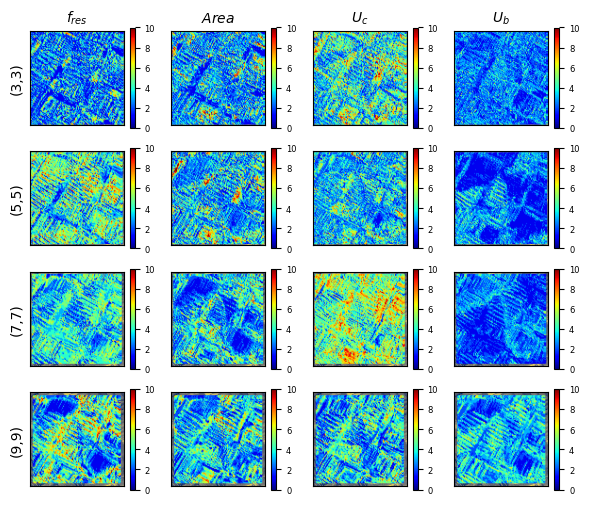

In [187]:
threshold = .5

fig, ax = plt.subplots(4, 4, figsize=(7, 6))

for _ in ax.flatten():
  _.imshow(patch_image, interpolation='nearest', cmap='cividis', origin='lower')
  _.set_xticks([])
  _.set_yticks([])

for i, ws in enumerate(ws_list):
  att_w_list = full_res[ws]['att_w']
  coords = full_res[ws]['coords'].astype(int)

  for j in range(4):
    bool_att = att_w_list[j] > .5
    sum_att = bool_att.sum(axis=1)
    im = ax[i,j].scatter(*coords.T, c=sum_att, s=.3, vmax=10, vmin=0, cmap='jet')
    cbar = plt.colorbar(im)
    cbar.ax.tick_params(labelsize=6)

    if j==0:
      ax[i,j].set_ylabel(f'({ws},{ws})')

ax[0,0].set_title('$f_{res}$', fontsize=10)
ax[0,1].set_title('$Area$', fontsize=10)
ax[0,2].set_title('$U_c$', fontsize=10)
ax[0,3].set_title('$U_b$', fontsize=10)

fig.savefig('attent_number_lat_v.jpg', dpi=300, bbox_inches='tight')

## 5.2 2D

You may either upload the model provided in the article or skip the next cell to use a model you have trained yourself.

In [219]:
!gdown --fuzzy https://drive.google.com/file/d/1AdkOtGooTiVlcuEz-ZlphqyCEJWyJ2F9/view?usp=sharing

Downloading...
From (original): https://drive.google.com/uc?id=1AdkOtGooTiVlcuEz-ZlphqyCEJWyJ2F9
From (redirected): https://drive.google.com/uc?id=1AdkOtGooTiVlcuEz-ZlphqyCEJWyJ2F9&confirm=t&uuid=33a6f3a1-4f87-447d-9c56-bac9e397a27f
To: /content/vae_transformer_shap_2d.pth
100% 31.9M/31.9M [00:00<00:00, 43.0MB/s]


In [220]:
#import vae results
state_dicts = torch.load(r'/content/vae_transformer_shap_2d.pth', weights_only=False,  map_location=torch.device('cpu'))
full_res = load_attention_regressor(state_dicts)

In [221]:
full_res.keys()

dict_keys(['3', '5', '7', '9'])

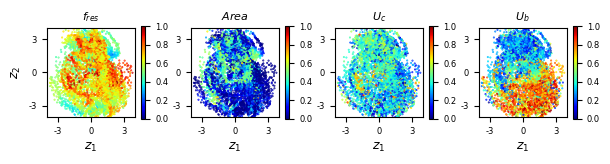

In [222]:
ws = '9'
z_means = full_res[ws]['z_mean']
coords = full_res[ws]['coords']
importance = full_res[ws]['att_w']
sh = full_res[ws]['shap']


fig, ax = plt.subplots(1, 4, figsize=(7, 1.2))
fig.subplots_adjust(wspace=.3)

for i in range(4):
  im = ax[i].scatter(*z_means[:, 1:].T,s=.2,
              c = targets[i][*coords.astype(int).T].flatten(),
              cmap='jet', vmin=0, vmax=1)
  ax[i].tick_params('both',labelsize=6)
  cbar = plt.colorbar(im)
  cbar.ax.tick_params(labelsize=6)

  ax[i].set_xlabel(r'$z_1$', fontsize=9)

  ax[i].set_aspect('equal')

  ax[i].set_xlim(-4,4)
  ax[i].set_ylim(-4,4)
  ax[i].set_yticks([-3,0,3], [-3,0,3])
  ax[i].set_xticks([-3,0,3], [-3,0,3])

ax[0].set_ylabel(r'$z_2$', fontsize=9)

ax[0].set_title('$f_{res}$', fontsize=8)
ax[1].set_title('$Area$', fontsize=8)
ax[2].set_title('$U_c$', fontsize=8)
ax[3].set_title('$U_b$', fontsize=8)

fig.savefig('fig4_1.jpg', dpi=300, bbox_inches='tight')

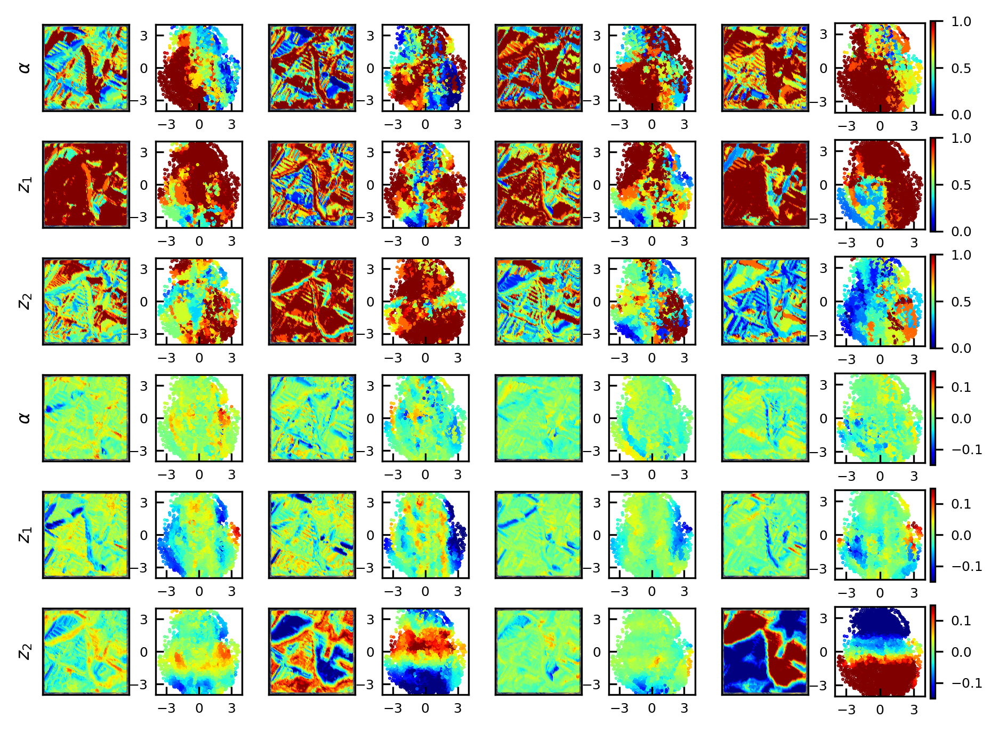

In [223]:
fig, ax = plt.subplots(6, 8, figsize=(7.3,5.5), dpi=300, gridspec_kw={'width_ratios': [1,1,1,1,1,1,1,1.3]})
fig.subplots_adjust(wspace=.3, hspace=.25)

for i in range(len(ax[:, 0])):
  ax[i,0].imshow(patch_image, interpolation='nearest', cmap='cividis', origin='lower')
  ax[i,2].imshow(patch_image, interpolation='nearest', cmap='cividis', origin='lower')
  ax[i,4].imshow(patch_image, interpolation='nearest', cmap='cividis', origin='lower')
  ax[i,6].imshow(patch_image, interpolation='nearest', cmap='cividis', origin='lower')

  ax[i,0].set_xticks([])
  ax[i,0].set_yticks([])
  ax[i,2].set_xticks([])
  ax[i,2].set_yticks([])
  ax[i,4].set_xticks([])
  ax[i,4].set_yticks([])
  ax[i,6].set_xticks([])
  ax[i,6].set_yticks([])

for i in range(4):
  for j in range(3):
    ax[j,2*i].scatter(*coords.T,s=.2,
                  c = importance[i][:,j],
                  cmap='jet', vmin=0, vmax=1)
    ax[j+3,2*i].scatter(*coords.T,s=.2,
                  c = sh[i][:,j],
                  cmap='jet', vmin=-.15, vmax=.15)
    im = ax[j,2*i+1].scatter(*z_means[:, 1:].T,s=.2,
                  c = importance[i][:,j],
                  cmap='jet', vmin=0, vmax=1)
    if i==3:
      cbar = plt.colorbar(im)
      cbar.ax.tick_params(labelsize=6)
    im = ax[j+3,2*i+1].scatter(*z_means[:, 1:].T,s=.2,
                  c = sh[i][:,j],
                  cmap='jet', vmin=-.15, vmax=.15)
    if i==3:
      cbar = plt.colorbar(im)
      cbar.ax.tick_params(labelsize=6)

for i, ax_ in enumerate(ax.flatten()):
  if i % 2 == 1:
    ax_.tick_params('both',labelsize=6)
    ax_.set_aspect('equal')
    ax_.set_xlim(-4,4)
    ax_.set_ylim(-4,4)
    ax_.set_xticks([-3,0,3])
    ax_.set_yticks([-3,0,3])
    ax_.tick_params(direction='in', labelsize=6)

ax[0,0].set_ylabel(r'$\alpha$', fontsize=8)
ax[1,0].set_ylabel('$z_1$', fontsize=8)
ax[2,0].set_ylabel('$z_2$', fontsize=8)

ax[3,0].set_ylabel(r'$\alpha$', fontsize=8)
ax[4,0].set_ylabel('$z_1$', fontsize=8)
ax[5,0].set_ylabel('$z_2$', fontsize=8)


fig.savefig('fig4_2.jpg', dpi=300, bbox_inches='tight')